# PROJECT 2

## Cancer detection using CNN

### Requirements

In [1]:
!pip install opencv-python

In [73]:
import pandas as pd
import numpy as np
import os
import sys
import matplotlib.pyplot as plt
import seaborn as sns
import torch

#### Writing Helpers from class resources  (`Week_8_cnn.ipynb`)

In [74]:
def moveTo(obj, device):
    if isinstance(obj, list):
        return [moveTo(x, device) for x in obj]
    elif isinstance(obj, tuple):
        return tuple(moveTo(list(obj), device))
    elif isinstance(obj, set):
        return set(moveTo(list(obj), device))
    elif isinstance(obj, dict):
        to_ret = dict()
        for key, value in obj.items():
            to_ret[moveTo(key, device)] = moveTo(value, device)
        return to_ret
    elif isinstance(obj, torch.Tensor):
        return obj.to(device)
    else:
        return obj

In [75]:
# setup for matplotlib in Jupyter Notebook
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')

C:\Users\devdp\AppData\Local\Temp\ipykernel_17464\1153496997.py:4: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('png', 'pdf')


In [76]:
def set_seed(seed):
    torch.manual_seed(seed)
    np.random.seed(seed)

In [77]:
torch.backends.cudnn.deterministic=True
set_seed(42)

In [78]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

In [79]:
!nvidia-smi

Mon Apr 14 10:45:10 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 571.96                 Driver Version: 571.96         CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4060 ...  WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   49C    P8              4W /  122W |     463MiB /   8188MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# EDA

In [3]:
train_full = pd.read_csv('./data/train_labels.csv')

In [4]:
train_full.head()

,id,label
0,f38a6374c348f90b587e046aac6079959adf3835,0
1,c18f2d887b7ae4f6742ee445113fa1aef383ed77,1
2,755db6279dae599ebb4d39a9123cce439965282d,0
3,bc3f0c64fb968ff4a8bd33af6971ecae77c75e08,0
4,068aba587a4950175d04c680d38943fd488d6a9d,0


In [5]:
train_full.isna().sum()

id       0
label    0
dtype: int64

Text(0.5, 1.0, 'Distribution of Labels in Train Set')

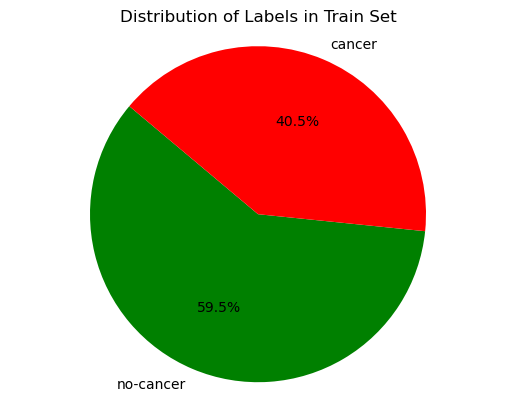

In [6]:
plt.pie(train_full['label'].value_counts(), labels=train_full['label'].map({0: 'no-cancer', 1: 'cancer'}).value_counts().index, autopct='%1.1f%%', colors=['green', 'red'], startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Distribution of Labels in Train Set')

In [82]:
def visualize_images(images, start_index = 0 , count=10):
    """
    Visualize a set of images from the dataset.
    :param images: DataFrame containing image IDs and labels
    for id, label in images[start_index: start_index+count].iterrows():
        image_path = os.path.join('./data/train/', id + '.tif')
        image = plt.imread(image_path)
        plt.imshow(image)
        plt.axis('off')
        plt.show()
    """
    fig = plt.figure(figsize=(30, 6))
    for idx , val in enumerate(images[start_index: start_index+count].iterrows()):
        id = val[1].id
        label = val[1].label
        ax = fig.add_subplot(2, count//2, idx+1, xticks=[], yticks=[])
        image_path = os.path.join('./data/train/', id + '.tif')
        image = plt.imread(image_path)
        plt.imshow(image)
        ax.set_title(f"Label: {label}")
    plt.show()

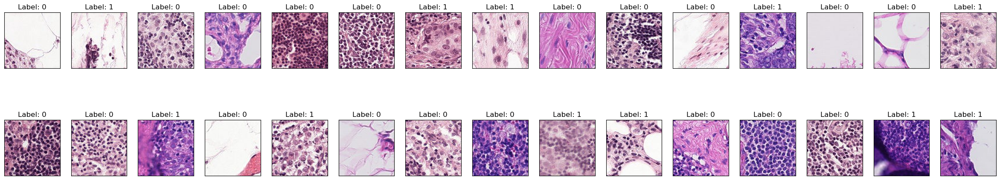

In [83]:
visualize_images(train_full, 0, 30)

## Taking only subset of whole dataset (5000 images)

In [84]:
from sklearn.utils import shuffle

# Sampling 5000 images from the dataset, 2500 with label 1 and 2500 with label 0 to balance the dataset
positive = train_full[train_full['label'] == 1].sample(n=5000//2, random_state=42)
negative = train_full[train_full['label'] == 0].sample(n=5000//2, random_state=42)

train = shuffle(pd.concat([positive, negative])).reset_index(drop=True)

In [85]:
import cv2
from tqdm import tqdm_notebook,trange
def load_data(df, image_dir='./data/train/'):
    """
    Load image data and corresponding labels from a given DataFrame.

    Parameters:
    - df (pd.DataFrame): DataFrame containing image IDs and labels.
                         It must have columns 'id' and 'label'.
    - image_dir (str): Path to the directory containing image files.

    Returns:
    - X (np.ndarray): Array of loaded images.
    - y (np.ndarray): Array of corresponding labels.
    """
    images = []
    labels = []

    for image_id, label in tqdm_notebook(zip(df['id'], df['label']), total=len(df), desc="Loading images"):
        image_path = os.path.join(image_dir, f"{image_id}.tif")
        image = cv2.imread(image_path)

        if image is None:
            print(f"Warning: Image {image_path} could not be loaded.")
            continue

        images.append(image)
        labels.append(label)

    print(f"Loaded {len(images)} images and {len(labels)} labels.")
    return np.array(images), np.array(labels)
    


In [86]:
images, labels = load_data(train)

C:\Users\devdp\AppData\Local\Temp\ipykernel_17464\3637710318.py:19: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for image_id, label in tqdm_notebook(zip(df['id'], df['label']), total=len(df), desc="Loading images"):


Loading images:   0%|          | 0/5000 [00:00<?, ?it/s]

Loaded 5000 images and 5000 labels.


In [87]:
print(images.shape, labels.shape)

(5000, 96, 96, 3) (5000,)


In [88]:
positive = images[labels == 1]
negative = images[labels == 0]

## Visulizing features from training images

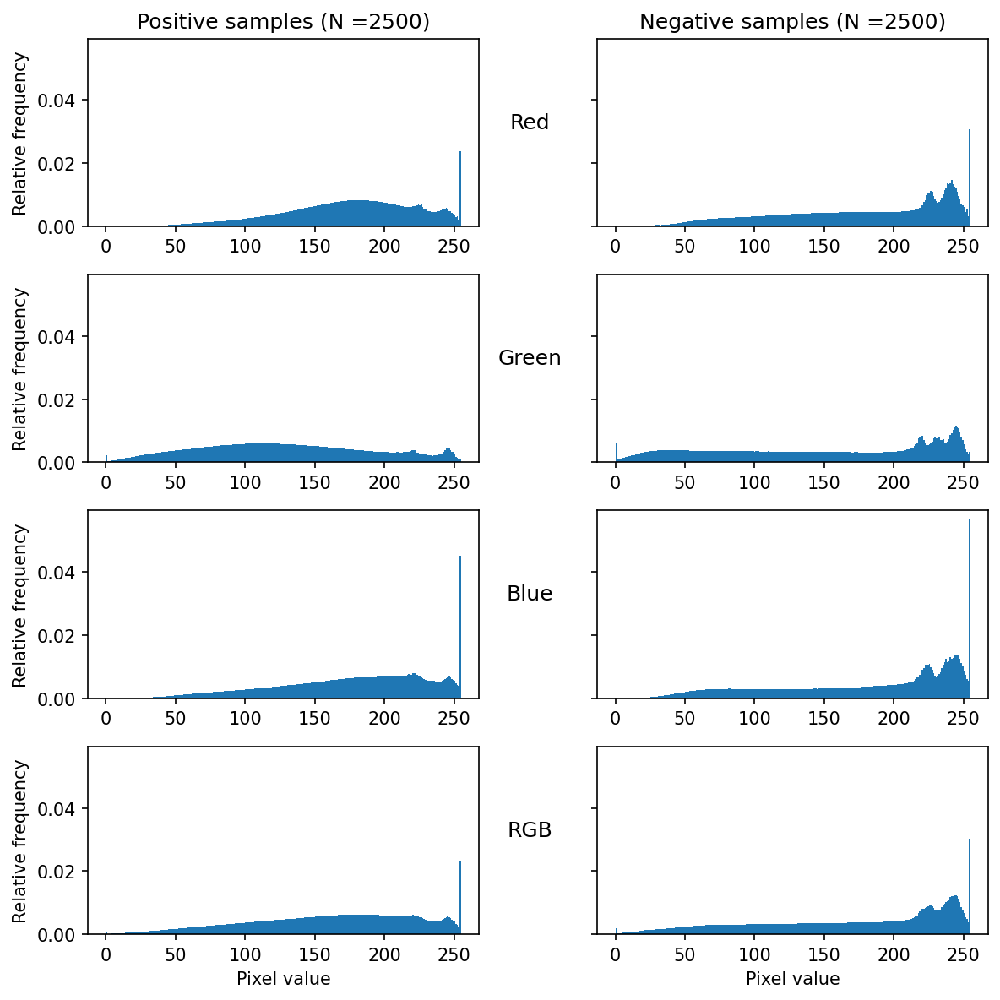

In [89]:
# reference: https://www.kaggle.com/code/walia20/histopathologic-cancer-detection-using-cnns?scriptVersionId=66526139&cellId=17

nr_of_bins = 256 #each possible pixel value will get a bin in the following histograms
fig,axs = plt.subplots(4,2,sharey=True,figsize=(8,8),dpi=150)

#RGB channels
axs[0,0].hist(positive[:,:,:,0].flatten(),bins=nr_of_bins,density=True)
axs[0,1].hist(negative[:,:,:,0].flatten(),bins=nr_of_bins,density=True)
axs[1,0].hist(positive[:,:,:,1].flatten(),bins=nr_of_bins,density=True)
axs[1,1].hist(negative[:,:,:,1].flatten(),bins=nr_of_bins,density=True)
axs[2,0].hist(positive[:,:,:,2].flatten(),bins=nr_of_bins,density=True)
axs[2,1].hist(negative[:,:,:,2].flatten(),bins=nr_of_bins,density=True)

#All channels
axs[3,0].hist(positive.flatten(),bins=nr_of_bins,density=True)
axs[3,1].hist(negative.flatten(),bins=nr_of_bins,density=True)

#Set image labels
axs[0,0].set_title("Positive samples (N =" + str(positive.shape[0]) + ")");
axs[0,1].set_title("Negative samples (N =" + str(negative.shape[0]) + ")");
axs[0,1].set_ylabel("Red",rotation='horizontal',labelpad=35,fontsize=12)
axs[1,1].set_ylabel("Green",rotation='horizontal',labelpad=35,fontsize=12)
axs[2,1].set_ylabel("Blue",rotation='horizontal',labelpad=35,fontsize=12)
axs[3,1].set_ylabel("RGB",rotation='horizontal',labelpad=35,fontsize=12)
for i in range(4):
    axs[i,0].set_ylabel("Relative frequency")
axs[3,0].set_xlabel("Pixel value")
axs[3,1].set_xlabel("Pixel value")
fig.tight_layout()

From above plots we can see the differences in distributions of channels.
Observations:
1. positvie samples the green channel has darker green channels.
2. High pixel values are due to white regions in images

Let's visualize brightness levels of images

Text(0, 0.5, 'Relative frequency')

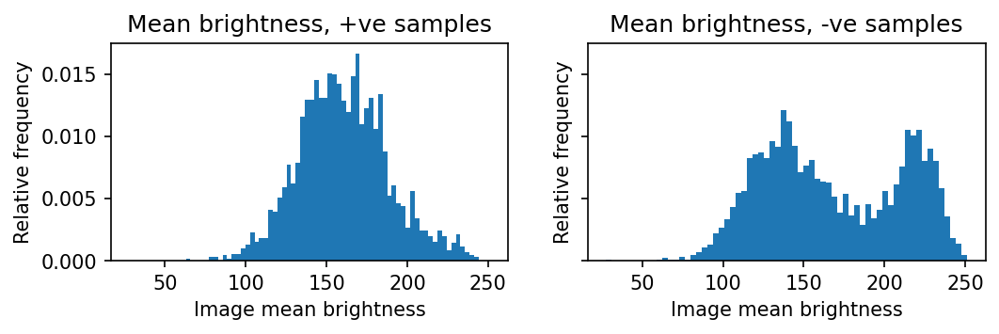

In [90]:
# reference: https://www.kaggle.com/code/walia20/histopathologic-cancer-detection-using-cnns?scriptVersionId=66526139&cellId=19
nr_of_bins = 64 #we use a bit fewer bins to get a smoother image
fig,axs = plt.subplots(1,2,sharey=True, sharex = True, figsize=(8,2),dpi=150)
axs[0].hist(np.mean(positive,axis=(1,2,3)),bins=nr_of_bins,density=True);
axs[1].hist(np.mean(negative,axis=(1,2,3)),bins=nr_of_bins,density=True);
axs[0].set_title("Mean brightness, +ve samples")
axs[1].set_title("Mean brightness, -ve samples")
axs[0].set_xlabel("Image mean brightness")
axs[1].set_xlabel("Image mean brightness")
axs[0].set_ylabel("Relative frequency")
axs[1].set_ylabel("Relative frequency")

From above results we can obeserve:
1. The +ve samples showcase normal distributation and -ve samples showcase bimodal distribution
2. Many images contain bright regions so might need to normalize that.

# Data Processing

## Creating Tensor Dataset

In [91]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import cv2
import pandas as pd
from skimage import io, transform
from sklearn.utils import shuffle

In [109]:

# reference: https://pytorch.org/tutorials/beginner/data_loading_tutorial.html#dataset-class
class CancerDataset(Dataset):
    """Cancer Detection Dataset."""

    def __init__(self, csv_file, root_dir, N=5000, transform=None):
        """
        Arguments:
            csv_file (string): Path to the csv file with labels.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        df = pd.read_csv(csv_file)

        if N:
            # Ensure class balance: 2500 from each class
            negative_df = df[df['label'] == 0].sample(n=N//2, random_state=42)
            positive_df = df[df['label'] == 1].sample(n=N//2, random_state=42)
            df = shuffle(pd.concat([positive_df, negative_df])).reset_index(drop=True)

        self.images = df
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = os.path.join(self.root_dir, self.images.iloc[idx, 0] + ".tif")
        image = io.imread(img_name) 

        label = int(self.images.iloc[idx, 1])  # 0 or 1
        sample = {'image': image, 'label': label, "id" : self.images.iloc[idx, 0]}

        if self.transform:
            sample['image'] = self.transform(image)

        return sample

In [110]:
cancer_dataset = CancerDataset(
    csv_file='./data/train_labels.csv',
    root_dir='./data/train',
)

In [111]:
import matplotlib.pyplot as plt

def show_samples(dataset, num_samples=4, figsize=(15, 5)):
    """
    Visualize sample images from a dataset.

    Args:
        dataset (Dataset): PyTorch dataset object with 'image' and 'label'.
        num_samples (int): Number of samples to visualize.
        figsize (tuple): Size of the matplotlib figure.
    """
    fig = plt.figure(figsize=figsize)

    for i, sample in enumerate(dataset):
        image = sample['image']
        label = sample['label']
        id = sample['id']

        # If image is a tensor, convert to numpy and unnormalize
        if isinstance(image, torch.Tensor):
            image = image.permute(1, 2, 0).numpy()  # CxHxW to HxWxC
            image = image * 0.5 + 0.5  # Unnormalize (if normalized with mean=0.5, std=0.5)

        ax = plt.subplot(1, num_samples, i + 1)
        plt.tight_layout()
        ax.set_title(f"Label: {label}")
        ax.axis('off')
        plt.imshow(image)

        if i == num_samples - 1:
            plt.show()
            break

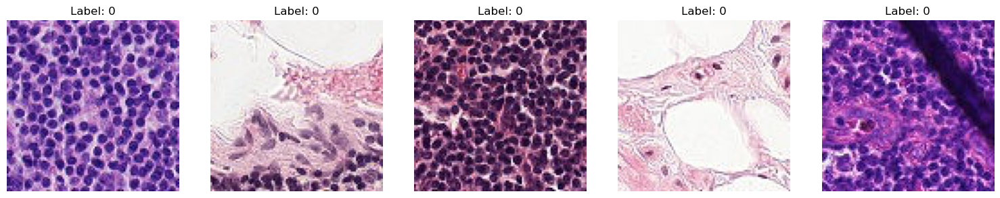

In [112]:
show_samples(cancer_dataset, num_samples=5)

### Defining data augmentation methods

In [113]:
from torchvision.transforms import v2

# Augmentation Method 1: Geometric and Color Transformations
aug_method_1 = v2.Compose([
    v2.ToPILImage(),
    v2.Resize((224, 224)),  # For ResNet model
    v2.RandomHorizontalFlip(p=0.5),  # Randomly flip the image horizontally
    v2.RandomVerticalFlip(p=0.5),  # Randomly flip the image vertically
    v2.RandomRotation(degrees=30),  # Rotate the image within ±30 degrees
    v2.ColorJitter(
        brightness=0.2,
        contrast=0.2,
    ),  # Adjust image color properties
    v2.ToTensor(),  # Convert image to tensor
    v2.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# Augmentation Method 2: Added Elastic Transform in previous method
aug_method_2 = v2.Compose([
    v2.ToPILImage(),
    v2.Resize((224, 224)),  # For ResNet model
    v2.RandomHorizontalFlip(p=0.5),  # Randomly flip the image horizontally
    v2.RandomVerticalFlip(p=0.5),
    v2.RandomRotation(degrees=15),  # Slight random rotation,
    v2.ColorJitter(
        brightness=0.3,
        contrast=0.3
    ),  # Adjust brightness and contrast
    v2.ToTensor(),  # Convert image to tensor
    v2.ElasticTransform(alpha=30.0),  # Slight tissue deformation
    v2.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


val_test_aug_method = v2.Compose([
    v2.ToPILImage(),
    v2.Resize((224, 224)),  # For ResNet model
    v2.ToTensor(),  # Convert image to tensor
    v2.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

c:\Users\devdp\anaconda3\Lib\site-packages\torchvision\transforms\v2\_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


In [114]:
from torch.utils.data import random_split 

def split_data(dataset:Dataset):

    total_size = len(dataset)
    train_size = int(0.7 * total_size)
    val_size = int(0.2 * total_size)
    test_size = total_size - train_size - val_size

    train_dataset, val_dataset, test_dataset = random_split(
        dataset, [train_size, val_size, test_size],
        generator=torch.Generator().manual_seed(42)
    )

    return train_dataset, val_dataset, test_dataset

def create_data_loaders(train_dataset, val_dataset, test_dataset, batch_size=32):
    """
    Creates DataLoaders from train, val, and test datasets.

    Args:
        train_dataset: Training dataset.
        val_dataset: Validation dataset.
        test_dataset: Test dataset.
        batch_size (int): Batch size for loaders.

    Returns:
        train_loader, val_loader, test_loader
    """
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader


def generate_data(file, img_dir, options, N=5000 ):
    """
    Generate data loaders and datasets based on the provided options.
    
    Args:
        file (str): Path to the CSV file containing image IDs and labels.
        img_dir (str): Directory containing the images.
        options (list): List of dictionaries containing options for data generation.
        N (int): Number of samples to load from the dataset.
    Returns:
        results (list): List of dictionaries containing configurations for each option.
        Each dictionary contains the name, loaders, datasets, and parameters.
    """
    
    
    results = []

    for idx, option in enumerate(options):
        name = option.get("name", None)
        transformer = option.get("transformer", None)
        split = option.get("split", [0.7,0.2,0.2])
        val_test_transformer = option.get("val_test_transformer", None)
        assert len(split) == 3, "Length of split should be 3"

        dataset = CancerDataset(
            csv_file=file,
            root_dir=img_dir,
            transform=transformer,
            N=N
        )

        train_dataset, val_dataset, test_dataset = split_data(dataset)
        val_dataset.dataset.transform = val_test_transformer
        train_loader, val_loader, test_loader = create_data_loaders(
            train_dataset, val_dataset, test_dataset,
            batch_size=32
        )
        val_dataset.dataset.transform = val_test_transformer
        test_dataset.dataset.transform = val_test_transformer
        config = {
                "name" : name if name else f"config_{idx+1}",
                "loaders":{
                    "train_loader": train_loader,
                    "val_loader": val_loader,
                    "test_loader": test_loader,
                },
                "datasets":{
                    "train_dataset": train_dataset,
                    "val_dataset": val_dataset,
                    "test_dataset": test_dataset,
                },
                "parameters":{
                    "transformer": transformer,
                    "val_test_transformer": val_test_transformer,
                    "split": split
                }
            }

        results.append(config)
    return results
        

In [115]:
options = [
    {
        "name": "Augmentation Method 1",
        "transformer": aug_method_1,
        "val_test_transformer": val_test_aug_method,
        "split": [0.7, 0.2, 0.1]
    },
    {
        "name": "Augmentation Method 2",
        "transformer": aug_method_2,
        "val_test_transformer": val_test_aug_method,
        "split": [0.7, 0.2, 0.1]
    }
]

data_configs = generate_data(file="./data/train_labels.csv", img_dir="./data/train", options=options, N=5000)
for config in data_configs:
    print(f"Configuration: {config['name']}")
    print(f"Train Loader: {len(config['loaders']['train_loader'])} batches")
    print(f"Validation Loader: {len(config['loaders']['val_loader'])} batches")
    print(f"Test Loader: {len(config['loaders']['test_loader'])} batches")
    print("-" * 100)

Configuration: Augmentation Method 1
Train Loader: 110 batches
Validation Loader: 32 batches
Test Loader: 16 batches
----------------------------------------------------------------------------------------------------
Configuration: Augmentation Method 2
Train Loader: 110 batches
Validation Loader: 32 batches
Test Loader: 16 batches
----------------------------------------------------------------------------------------------------


In [116]:
def plot_images_for_configs(data_configs, num_images=5):
    """
    Plot a specified number of images for each configuration and dataset (train, validation, test).

    Args:
        data_configs (list): List of data configurations containing datasets and loaders.
        num_images (int): Number of images to plot for each dataset.
    """
    for config in data_configs:
        print(f"Configuration: {config['name']}")
        datasets = config['datasets']
        for dataset_name, dataset in datasets.items():
            print(f"Dataset: {dataset_name}")
            fig, axs = plt.subplots(1, num_images, figsize=(15, 5))
            for i in range(num_images):
                sample = dataset[i]
                image = sample['image']
                label = sample['label']

                # If image is a tensor, convert to numpy and unnormalize
                if isinstance(image, torch.Tensor):
                    image = image.permute(1, 2, 0).numpy()  # CxHxW to HxWxC
                    image = image * 0.5 + 0.5  # Unnormalize (if normalized with mean=0.5, std=0.5)

                axs[i].imshow(image)
                axs[i].set_title(f"Label: {label}")
                axs[i].axis('off')
            plt.tight_layout()
            plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Configuration: Augmentation Method 1
Dataset: train_dataset


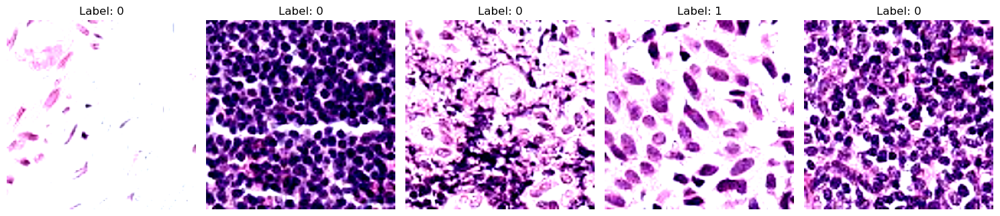

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Dataset: val_dataset


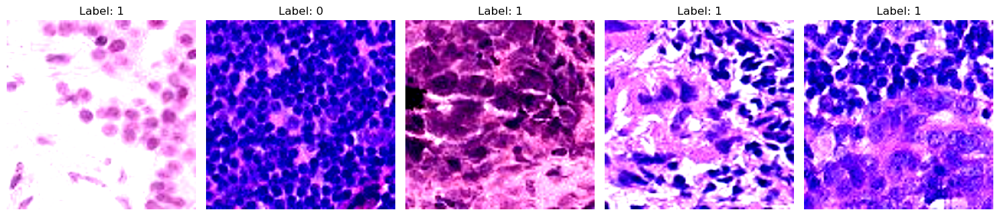

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Dataset: test_dataset


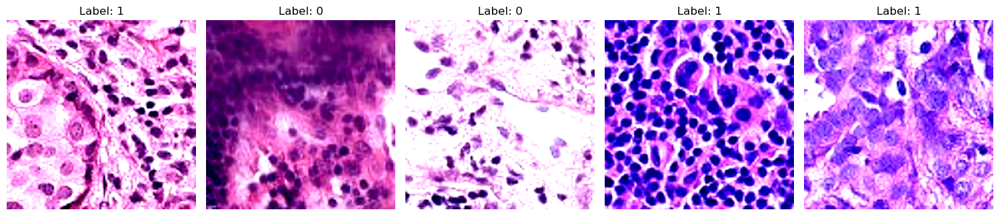

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Configuration: Augmentation Method 2
Dataset: train_dataset


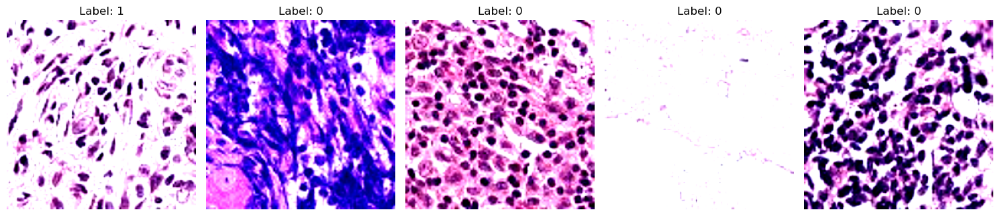

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Dataset: val_dataset


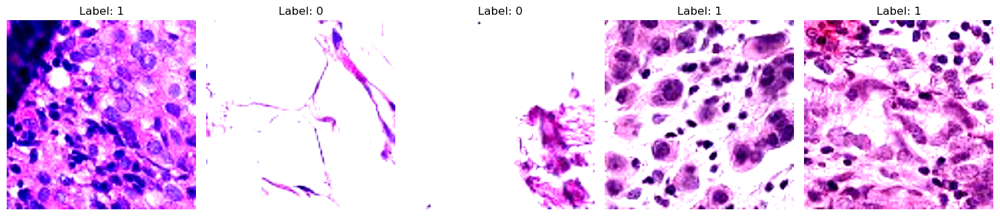

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Dataset: test_dataset


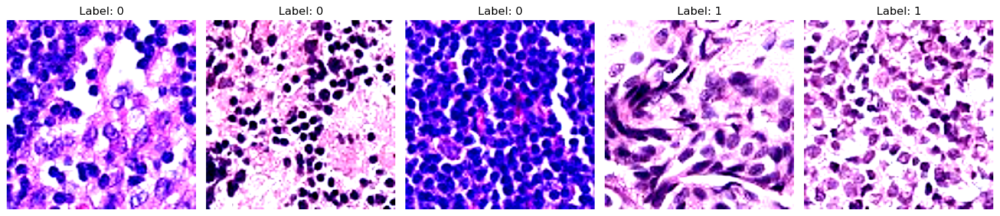

In [117]:
plot_images_for_configs(data_configs, num_images=5)

# Model Preperation

### Helper functions from `week_8_cnn.ipynb`

In [120]:
import time
import timeit
from tqdm.autonotebook import tqdm

def run_epoch(model, optimizer, data_loader, loss_func, device, results, score_funcs, prefix="", desc=None):
    """
    model -- the PyTorch model / "Module" to run for one epoch
    optimizer -- the object that will update the weights of the network
    data_loader -- DataLoader object that returns tuples of (input, label) pairs.
    loss_func -- the loss function that takes in two arguments, the model outputs and the labels, and returns a score
    device -- the compute lodation to perform training
    score_funcs -- a dictionary of scoring functions to use to evalue the performance of the model
    prefix -- a string to pre-fix to any scores placed into the _results_ dictionary.
    desc -- a description to use for the progress bar.
    """
    running_loss = []
    y_true = []
    y_pred = []
    start = time.time()
    for i in tqdm(data_loader, desc=desc, leave=False):
        inputs, labels = i['image'], i['label']
        #Move the batch to the device we are using.
        inputs = moveTo(inputs, device)
        labels = moveTo(labels, device)

        y_hat = model(inputs) #this just computed f_Θ(x(i))
        # Compute loss.
        loss = loss_func(y_hat, labels)

        if model.training:
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

        #Now we are just grabbing some information we would like to have
        running_loss.append(loss.item())

        if len(score_funcs) > 0 and isinstance(labels, torch.Tensor):
            #moving labels & predictions back to CPU for computing / storing predictions
            labels = labels.detach().cpu().numpy()
            y_hat = y_hat.detach().cpu().numpy()
            #add to predictions so far
            y_true.extend(labels.tolist())
            y_pred.extend(y_hat.tolist())
    #end training epoch
    end = time.time()

    y_pred = np.asarray(y_pred)
    if len(y_pred.shape) == 2 and y_pred.shape[1] > 1: #We have a classification problem, convert to labels
        y_pred = np.argmax(y_pred, axis=1)
    #Else, we assume we are working on a regression problem

    results[prefix + " loss"].append( np.mean(running_loss) )
    for name, score_func in score_funcs.items():
        try:
            results[prefix + " " + name].append( score_func(y_true, y_pred) )
        except:
            results[prefix + " " + name].append(float("NaN"))
    return end-start #time spent on epoch

def train_network(model, loss_func, train_loader, val_loader=None, test_loader=None,score_funcs=None,
                         epochs=10, device="cpu", checkpoint_file=None,
                         lr_schedule=None, optimizer=None, disable_tqdm=False
                        ):
    """Train simple neural networks

    Keyword arguments:
    model -- the PyTorch model / "Module" to train
    loss_func -- the loss function that takes in batch in two arguments, the model outputs and the labels, and returns a score
    train_loader -- PyTorch DataLoader object that returns tuples of (input, label) pairs.
    val_loader -- Optional PyTorch DataLoader to evaluate on after every epoch
    test_loader -- Optional PyTorch DataLoader to evaluate on after every epoch
    score_funcs -- A dictionary of scoring functions to use to evalue the performance of the model
    epochs -- the number of training epochs to perform
    device -- the compute lodation to perform training
    lr_schedule -- the learning rate schedule used to alter \eta as the model trains. If this is not None than the user must also provide the optimizer to use.
    optimizer -- the method used to alter the gradients for learning.

    """
    if score_funcs == None:
        score_funcs = {}#Empty set

    to_track = ["epoch", "total time", "train loss"]
    if val_loader is not None:
        to_track.append("val loss")
    if test_loader is not None:
        to_track.append("test loss")
    for eval_score in score_funcs:
        to_track.append("train " + eval_score )
        if val_loader is not None:
            to_track.append("val " + eval_score )
        if test_loader is not None:
            to_track.append("test "+ eval_score )

    total_train_time = 0 #How long have we spent in the training loop?
    results = {}
    #Initialize every item with an empty list
    for item in to_track:
        results[item] = []


    if optimizer == None:
        #The AdamW optimizer is a good default optimizer
        optimizer = torch.optim.AdamW(model.parameters())
        del_opt = True
    else:
        del_opt = False

    #Place the model on the correct compute resource (CPU or GPU)
    model.to(device)
    for epoch in tqdm(range(epochs), desc="Epoch", disable=disable_tqdm):
        model = model.train()#Put our model in training mode

        total_train_time += run_epoch(model, optimizer, train_loader, loss_func, device, results, score_funcs, prefix="train", desc="Training")

        results["epoch"].append( epoch )
        results["total time"].append( total_train_time )


        if val_loader is not None:
            model = model.eval() #Set the model to "evaluation" mode, b/c we don't want to make any updates!
            with torch.no_grad():
                run_epoch(model, optimizer, val_loader, loss_func, device, results, score_funcs, prefix="val", desc="Validating")

        #In PyTorch, the convention is to update the learning rate after every epoch
        if lr_schedule is not None:
            if isinstance(lr_schedule, torch.optim.lr_scheduler.ReduceLROnPlateau):
                lr_schedule.step(results["val loss"][-1])
            else:
                lr_schedule.step()

        if test_loader is not None:
            model = model.eval() #Set the model to "evaluation" mode, b/c we don't want to make any updates!
            with torch.no_grad():
                run_epoch(model, optimizer, test_loader, loss_func, device, results, score_funcs, prefix="test", desc="Testing")


        if checkpoint_file is not None:
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'results' : results
                }, checkpoint_file)
    if del_opt:
        del optimizer

    return pd.DataFrame.from_dict(results)

## 1. ResNet50
## For the first model I will use ResNet50 pretrained model

reference : https://medium.com/@nitishkundu1993/exploring-resnet50-an-in-depth-look-at-the-model-architecture-and-code-implementation-d8d8fa67e46f

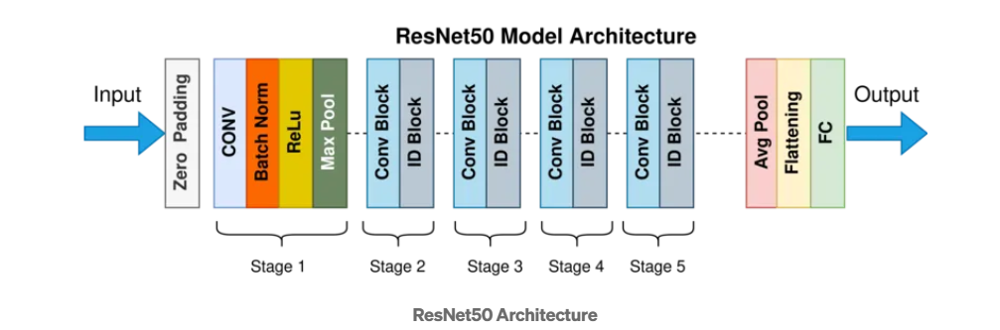

In [161]:
import torch
from torchvision.models import resnet50, ResNet50_Weights
from sklearn.metrics import accuracy_score
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau, CosineAnnealingLR 

# Loading the pretrained ResNet50 model
model = resnet50(weights=ResNet50_Weights.DEFAULT)
print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [162]:
# Freezing all layers except the last fully connected layer
for param in model.parameters():
    param.requires_grad = False
# Unfreezing the last fully connected layer
for param in model.fc.parameters():
    param.requires_grad = True

In [163]:
# Modifying final layer for binary classification
num_classes = 2
model.fc = nn.Sequential(
    nn.Linear(model.fc.in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, num_classes),
    nn.Softmax(dim=1)
)

Running model Configurations:   0%|          | 0/4 [00:00<?, ?it/s]

Running data Configurations:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

Running data Configurations:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

Running data Configurations:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

Running data Configurations:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

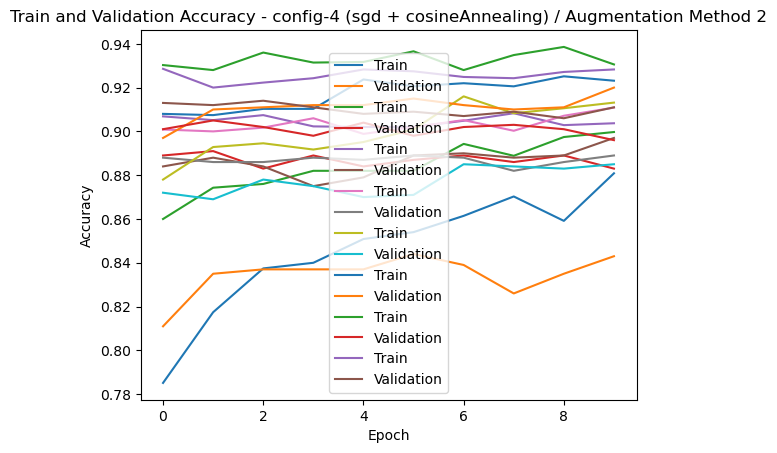

In [ ]:
model = model.to(device)
loss_func = nn.CrossEntropyLoss()
# Fine-tuning the model
results  = None
optimizers = [
    optim.AdamW(model.fc.parameters(), lr=0.001),
    optim.SGD(model.fc.parameters(), lr=0.001),
    optim.AdamW(model.fc.parameters(), lr=0.001),
    optim.SGD(model.fc.parameters(), lr=0.001),
]
model_configs = [
    {
        "name" : "config-1 (adam + reduceLROnPlateau)",
        "optimizer" : optimizers[0],
        'lr_schedule': ReduceLROnPlateau(optimizers[0], mode='min', factor=0.5, patience=3, verbose=True),
    },
    {
        "name" : "config-2 (sgd + reduceLROnPlateau)",
        "optimizer" : optimizers[1],
        'lr_schedule': ReduceLROnPlateau(optimizers[1], mode='min', factor=0.5, patience=3, verbose=True),
    },
    {
        "name" : "config-3 (adam + cosineAnnealing)",
        "optimizer" : optimizers[2],
        'lr_schedule': CosineAnnealingLR(optimizers[2], T_max=20),
    },
    {
        "name" : "config-4 (sgd + cosineAnnealing)",
        "optimizer" : optimizers[3],
        'lr_schedule': CosineAnnealingLR(optimizers[3], T_max=20),
    },

]

for model_config in tqdm(model_configs, desc="Running model Configurations"):
    for data_config in tqdm(data_configs, desc="Running data Configurations"):    
        _results = train_network(
            model=model,
            loss_func=loss_func,
            train_loader=data_config['loaders']['train_loader'],
            val_loader=data_config['loaders']['val_loader'],
            test_loader=data_config['loaders']['test_loader'],
            score_funcs={'Accuracy': accuracy_score},
            epochs=10,
            device=device,
            optimizer=model_config['optimizer'],
            lr_schedule= model_config['lr_schedule']
        )
        _results['model_config'] = model_config['name']
        _results['data_config'] = data_config['name']
        _results['transformer'] = data_config['parameters']['transformer']
        _results['val_test_transformer'] = data_config['parameters']['val_test_transformer']
        if results is None:
            results = _results
        else:
            results = pd.concat([results, _results], ignore_index=True)

# torch.save(model.state_dict(), "resnet50_finetuned.pth")

c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

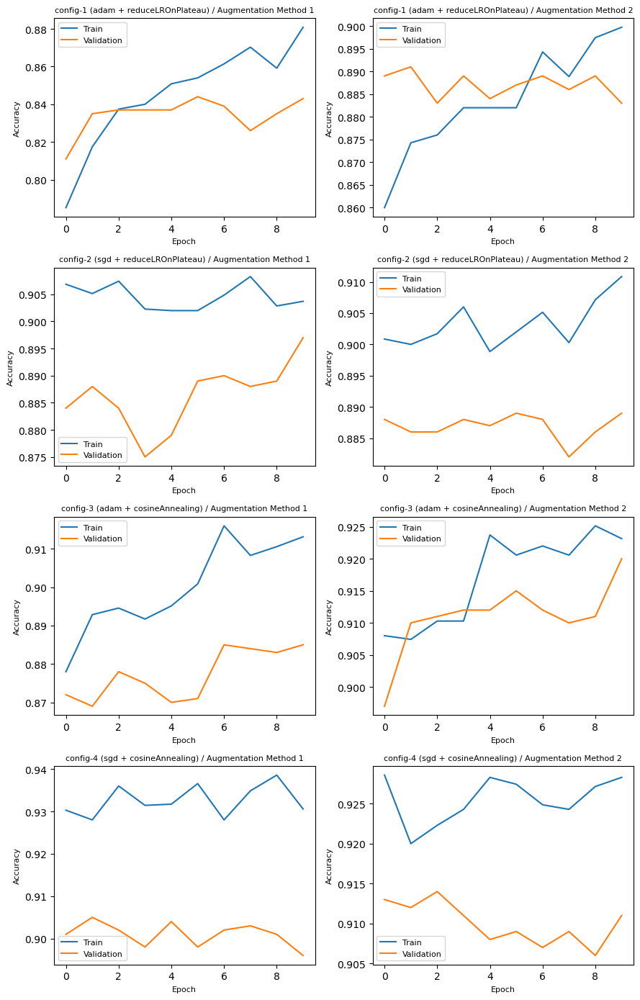

In [180]:
import math


# Count total plots needed
total_plots = len(model_configs) * len(data_configs)

# Create subplot grid (auto-calculated rows/cols)
cols = 2
rows = math.ceil(total_plots / cols)
fig, axes = plt.subplots(rows, cols, figsize=(cols * 4.5, rows * 3.5))
axes = axes.flatten()  # make 1D for easy indexing

# Plot results
plot_idx = 0
for model_config in model_configs:
    for data_config in data_configs:
        _results = results[(results['model_config'] == model_config['name']) & 
                           (results['data_config'] == data_config['name'])]

        ax = axes[plot_idx]
        ax.set_title(f"Model: {model_config['name']}\nData: {data_config['name']}")
        
        sns.lineplot(x='epoch', y='train Accuracy', data=_results, label='Train', ax=ax)
        sns.lineplot(x='epoch', y='val Accuracy', data=_results, label='Validation', ax=ax)  # modified to accept ax parameter
        ax.set_title(f'{_results["model_config"].values[0]} / {_results["data_config"].values[0]}', fontsize=8)
        ax.set_xlabel('Epoch', fontsize=8)
        ax.set_ylabel('Accuracy', fontsize=8)
        ax.legend(fontsize=8)
        
        
        plot_idx += 1

# Hide unused subplots
for i in range(plot_idx, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()